In [26]:
import pandas as pd
import numpy as np
import random,os
import seaborn as sns
import matplotlib.pyplot as plt

In [27]:
pd.set_option('display.max_columns', None)
seed=42

def seed_everything(seed=0):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
seed_everything(seed)

train=pd.read_csv('data/train.csv',sep=';')
val=pd.read_csv('data/test.csv',sep=';')

In [28]:
merged=pd.read_csv('data/train_all.csv')

print(list(train.columns))

pref_days = [0]
for year in range(2020, 2021):
    pref_days.append(pd.Timestamp(f'{year}-12-31').dayofyear)
print(pref_days)
for i in range(1, len(pref_days)):
    pref_days[i] += pref_days[i-1]
print(pref_days)

['label', 'period', 'subject_type', 'subject_name', 'city_name', 'hex', 'hex_lat', 'hex_lon', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20', 'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27', 'f28', 'f29', 'f30']
[0, 366]
[0, 366]


In [29]:
def prepare(x):
    date = x.split('-')
    #time = x[1].split(':')
    year,month,day = map(int, date)
    timestamp = pd.Timestamp(f'{year}-{month}-{day}')
    #hour = int(time[0])
    dayofyear = timestamp.dayofyear
    dayofweek = timestamp.dayofweek
    ind_date = dayofyear + pref_days[year - 2021] - 1
    #ind_hour = ind_date * 24 + hour
    if dayofweek >= 5:
        days_to_weekend = 0
    else:
        days_to_weekend = min(dayofweek + 1, abs(5 - dayofweek))
    return year, month,  dayofyear,  (month-1) // 3, ind_date

In [30]:
add_columns = ['year', 'month',  'dayofyear', 'season', 'ind_date']
train[add_columns] = list(train['period'].apply(prepare))
for col in add_columns:
    train[col] = train[col].astype(np.int32)
train = train.sort_values(by='ind_date')
train=train.drop('period',axis=1)

In [31]:
add_columns = ['year', 'month',  'dayofyear', 'season', 'ind_date']
val[add_columns] = list(val['period'].apply(prepare))
for col in add_columns:
    val[col] = val[col].astype(np.int32)
val = val.sort_values(by='ind_date')
val=val.drop('period',axis=1)

In [32]:
train['subject_or_city'] = 'subject'
train.loc[train['subject_type'] == 'Город', 'subject_or_city'] = 'city'

val['subject_or_city'] = 'subject'
val.loc[val['subject_type'] == 'Город', 'subject_or_city'] = 'city'

f_cols=['f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20', 'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27', 'f28', 'f29', 'f30']

maybe_imbalance=['f30','f23','f14','f5']
kitties=['subject_type','subject_name','city_name','subject_or_city','hex']

In [33]:
# train = train.drop('year', axis=1)

In [34]:
# def get_curs_euro_now(ind_date):
#     return np.nanmean(euro.loc[ind_date-7:ind_date]['curs'])
# def get_curs_euro_before(ind_date):
#     return np.nanmean(euro.loc[ind_date-14:ind_date-8]['curs'])
# def get_curs_dollar_now(ind_date):
#     return np.nanmean(dollar.loc[ind_date-7:ind_date]['curs'])
# def get_curs_dollar_before(ind_date):
#     return np.nanmean(dollar.loc[ind_date-14:ind_date-8]['curs'])


# train['euro_curs_cur']=train['ind_date'].apply(lambda x: get_curs_euro_now(x))
# print(train['euro_curs_cur'].value_counts())
# print(train['ind_date'].value_counts())
# train['euro_curs_last_week']=train['ind_date'].apply(lambda x: get_curs_euro_before(x))
# train['dollar_curs_cur']=train['ind_date'].apply(lambda x: get_curs_dollar_now(x))
# train['dollar_curs_last_week']=train['ind_date'].apply(lambda x: get_curs_dollar_before(x))

# val['euro_curs_cur']=val['ind_date'].apply(lambda x: get_curs_euro_now(x))
# val['euro_curs_last_week']=val['ind_date'].apply(lambda x: get_curs_euro_before(x))
# val['dollar_curs_cur']=val['ind_date'].apply(lambda x: get_curs_dollar_now(x))
# val['dollar_curs_last_week']=val['ind_date'].apply(lambda x: get_curs_dollar_before(x))

In [35]:
# prev_train = train.copy()

In [36]:
# train['lon*lat'] = train['hex_lon'] * train['hex_lat']
# train

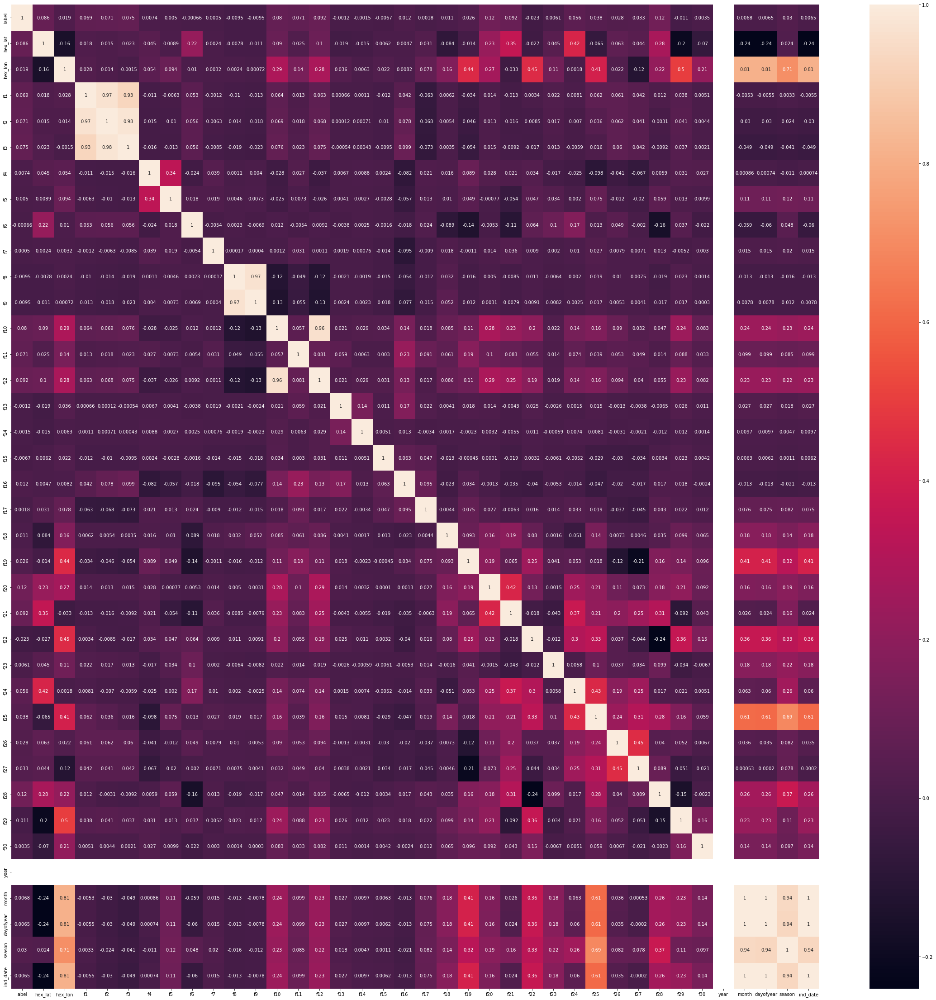

In [37]:
import seaborn as sn
import matplotlib.pyplot as plt

corrMatrix = train.corr()
fig, ax = plt.subplots(figsize=(40, 40))
sn.heatmap(corrMatrix, annot=True, ax=ax)
plt.show()

In [38]:
to_drop = ['year']
for i in range(len(train.columns)):
    a = train[train.columns[i]].value_counts().values[0]
    a = a / len(train) * 100
    # print(train.columns[i])
    # print(a)
    if a > 75 and train.columns[i] not in ['subject_or_city','label','euro_curs_cur','euro_curs_last_week',
                                           'dollar_curs_cur','dollar_curs_last_week',*kitties]:
        to_drop.append(train.columns[i])
        
train = train.drop(columns=to_drop)
val = val.drop(columns=to_drop)

In [39]:
to_drop = []
for i in train.columns:
    if (train[i].isna().sum() > len(train) * 0.15):
        to_drop.append(i)
train = train.drop(columns=to_drop)
val = val.drop(columns=to_drop)

In [40]:
train.subject_type.replace({"Автономный Округ": 'Республика',
                           "Автономная Область": 'Республика',
                           "Край": 'Область',
                           }, inplace=True)
val.subject_type.replace({"Автономный Округ": 'Республика',
                           "Автономная Область": 'Республика',
                           "Край": 'Область',
                           }, inplace=True)

In [41]:
for f in f_cols:
    if f in train.columns:
        train[f] = train[f].fillna(
            train.groupby('ind_date')[f].transform('median'))
        val[f] = val[f].fillna(
            val.groupby('ind_date')[f].transform('median'))

train['rate']=0.0
for i in range(len(train.subject_name.value_counts().keys())):
    train.loc[train['subject_name']==train.subject_name.value_counts().keys()[i], 'rate']=train[train['subject_name']==train.subject_name.value_counts().keys()[0]]['label'].sum()/train.subject_name.value_counts()[i]

In [42]:
games=['alchemist','lostark','tanks','warface','warplane','warship']

def twitch_viewers_now(ind_date):
    return np.nanmean(df2.loc[ind_date-7:ind_date]['Twitch Viewers'])
def twitch_viewers_before(ind_date):
    return np.nanmean(df2.loc[ind_date-14:ind_date-8]['Twitch Viewers'])
def players_now(ind_date):
    return np.nanmean(df2.loc[ind_date-7:ind_date]['Players'])
def players_before(ind_date):
    return np.nanmean(df2.loc[ind_date-14:ind_date-8]['Players'])


In [44]:
for game in games:
    df2=pd.read_csv(f'data/{game}.csv', sep=';')
    df2.DateTime=df2.DateTime.apply(lambda x: x.split(' ')[0])
    df2=df2.rename(columns={'DateTime': 'period'})

    for i in range(len(df2)):
        if int(df2.period[i].split('-')[0]) < 2021:
            df2 = df2.drop(i, axis=0)
    df2 = df2.reset_index(drop=True)

    df2[add_columns] = list(df2['period'].apply(prepare))

    for col in add_columns:
        df2[col] = df2[col].astype(np.int32)
    df2 = df2.sort_values(by='ind_date')
    df2 = df2.set_index('ind_date')

    train[f'twitch_viewers_{game}_now'] = train['ind_date'].apply(lambda x: twitch_viewers_now(x))
    train[f'twitch_viewers_{game}_last_week'] = train['ind_date'].apply(lambda x: twitch_viewers_before(x))
    train[f'players_{game}_now'] = train['ind_date'].apply(lambda x: players_now(x))
    train[f'players_{game}_last_week'] = train['ind_date'].apply(lambda x: players_before(x))

    val[f'twitch_viewers_{game}_now'] = val['ind_date'].apply(lambda x: twitch_viewers_now(x))
    val[f'twitch_viewers_{game}_last_week'] = val['ind_date'].apply(lambda x: twitch_viewers_before(x))
    val[f'players_{game}_now'] = val['ind_date'].apply(lambda x: players_now(x))
    val[f'players_{game}_last_week'] = val['ind_date'].apply(lambda x: players_before(x))

train.to_csv('data/train_games.csv',index=False)
val.to_csv('data/val_games.csv',index=False)

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\880433904.py:4: RuntimeWarning: Mean of empty slice
  return np.nanmean(df2.loc[ind_date-7:ind_date]['Twitch Viewers'])
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\880433904.py:6: RuntimeWarning: Mean of empty slice
  return np.nanmean(df2.loc[ind_date-14:ind_date-8]['Twitch Viewers'])
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\880433904.py:8: RuntimeWarning: Mean of empty slice
  return np.nanmean(df2.loc[ind_date-7:ind_date]['Players'])
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\880433904.py:10: RuntimeWarning: Mean of empty slice
  return np.nanmean(df2.loc[ind_date-14:ind_date-8]['Players'])
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\880433904.py:4: RuntimeWarning: Mean of empty slice
  return np.nanmean(df2.loc[ind_date-7:ind_date]['Twitch Viewers'])
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\880433904.py:6: RuntimeWarning: Mean of empty slice
  return np.nanmean(df2.loc[ind_date-

In [45]:
# for f in f_cols:
#     if f in train.columns:
#         train[f] = train[f].fillna(
#             train.groupby('ind_date')[f].transform('median'))
#         val[f] = val[f].fillna(
#             val.groupby('ind_date')[f].transform('median'))

train = pd.get_dummies(train, columns=kitties)
val = pd.get_dummies(val, columns=kitties)

In [46]:
for i in val.columns:
    if i not in train.columns:
        train[i] = 0
for i in train.columns:
    if i not in val.columns:
        val[i] = 0

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val[i] = 0
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\1261052349.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) in

In [47]:
train = train.sort_index(axis=1)
val = val.sort_index(axis=1)

In [48]:
# train = train.drop(['subject_type','subject_name','city_name', 'subject_or_city'], axis=1)
# val = val.drop(['subject_type','subject_name','city_name', 'subject_or_city'], axis=1)

In [49]:
# train['hex_lat'] = (train['hex_lat'] - train['hex_lat'].min()) / (train['hex_lat'].max() - train['hex_lat'].min())
# val['hex_lat'] = (val['hex_lat'] - val['hex_lat'].min()) / (val['hex_lat'].max() - val['hex_lat'].min())

# train['hex_lon'] = (train['hex_lon'] - train['hex_lon'].min()) / (train['hex_lon'].max() - train['hex_lon'].min())
# val['hex_lon'] = (val['hex_lon'] - val['hex_lon'].min()) / (val['hex_lon'].max() - val['hex_lon'].min())

In [50]:
train['f12*f11'] = train['f12'] * train['f11']
val['f12*f11'] = val['f12'] * val['f11']

train['f10*f11'] = train['f10'] * train['f11']
val['f10*f11'] = val['f10'] * val['f11']

train['f10*f11/f12*f11'] = train['f10*f11'] / train['f12*f11']
val['f10*f11/f12*f11'] = val['f10*f11'] / val['f12*f11']

C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\486273722.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train['f12*f11'] = train['f12'] * train['f11']
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\486273722.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val['f12*f11'] = val['f12'] * val['f11']
C:\Users\Vitruvius\AppData\Local\Temp\ipykernel_1956\486273722.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  

In [51]:
# X_train = train.drop('label',axis=1)[list(prev_feature_imps['Feature Id'])]
# y_train = train['label']

# X_val = val.drop('label',axis=1)[list(prev_feature_imps['Feature Id'])]
# y_val = val['label']

X_train = train.drop('label',axis=1)
y_train = train['label']

X_val = val.drop('label',axis=1)
y_val = val['label']

In [52]:
X_train

,city_name_1-е Выгорное,city_name_1-й,city_name_14 км,city_name_16 Партсъезд,city_name_2-го участка института им Докучаева,city_name_21 Свободный,city_name_8 Марта,city_name_Абабково,city_name_Абага,city_name_Абаза,city_name_Абакан,city_name_Абан,city_name_Абатское,city_name_Абдулино,city_name_Абинск,city_name_Абрамово,city_name_Авадан,city_name_Аввакумово,city_name_Авдеевка,city_name_Авдон,city_name_Автополигон,city_name_Авторемзавод,city_name_Агалатово,city_name_Аган,city_name_Агаповка,city_name_Агдары,city_name_Агеево,city_name_Агидель,city_name_Агинское,city_name_Агириш,city_name_Агиртамак,city_name_Агой,city_name_Агролес,city_name_Агроном,city_name_Адамовка,city_name_Адо-Тымово,city_name_Адыге-Хабль,city_name_Адыгейск,city_name_Адык,city_name_Азамай,city_name_Азаново,city_name_Азинский,city_name_Азов,city_name_Азово,city_name_Азовская,city_name_Айдарово,city_name_Айкино,city_name_Айхал,city_name_Академический,city_name_Акана,city_name_Акация,city_name_Акбердино,city_name_Акбулак,city_name_Аким-Сергеевка,city_name_Акманай-5 СНО,city_name_Аксай,city_name_Аксаково,city_name_Аксарка,city_name_Аксеново,city_name_Аксентис (Николо-Погостинский с/с),city_name_Акша,city_name_Акъяр,city_name_Алабердино,city_name_Алагир,city_name_Алапаевск,city_name_Алатырь,city_name_Алдан,city_name_Алейск,city_name_Александрийская,city_name_Александро-Невский,city_name_Александров,city_name_Александров Гай,city_name_Александровка,city_name_Александровка (Александровский с/о),city_name_Александровка 2-я,city_name_Александровск,city_name_Александровск-Сахалинский,city_name_Александровское,city_name_Алексеевка,city_name_Алексеевская,city_name_Алексеевский,city_name_Алексиковский,city_name_Алексин,city_name_Алексино (с/п Семенковское),city_name_Алесово,city_name_Алешково,city_name_Али-Бердуковский,city_name_Аликово,city_name_Алитуб,city_name_Алкино-2,city_name_Алмазный,city_name_Алнаши,city_name_Алтуд,city_name_Алтунино,city_name_Алферьевка,city_name_Альметьевск,city_name_Алябьевский,city_name_Амазар,city_name_Амга,city_name_Амурзет,city_name_Амурск,city_name_Анапа,city_name_Анапская,city_name_Анастасиевка,city_name_Анастасиевская,city_name_Анашкино (Артюшинского с/с),city_name_Ангарск,city_name_Ангоя,city_name_Анджиевский,city_name_Андреаполь,city_name_Андреевка,city_name_Андреевка (Андреевское с/п),city_name_Андреево,city_name_Андреево-Мелентьево,city_name_Андрейково,city_name_Андрейково (Бурашевское с.п.),city_name_Андромер,city_name_Анжеро-Судженск,city_name_Анива,city_name_Анисимовка,city_name_Анишино-1,city_name_Анкудиновка,city_name_Анна,city_name_Анненково,city_name_Анненковский Карьер,city_name_Аннино,city_name_Анопино,city_name_Антоновка,city_name_Анучино,city_name_Апаницыно,city_name_Апаринский,city_name_Апатиты,city_name_Апача,city_name_Апраксино,city_name_Апрелевка,city_name_Аптрякова,city_name_Апшеронск,city_name_Арамиль,city_name_Арга,city_name_Аргаяш,city_name_Арги-Паги,city_name_Аргудан,city_name_Арда,city_name_Ардатов,city_name_Ардон,city_name_Арефино,city_name_Арзамас,city_name_Арзгир,city_name_Аристово,city_name_Аркадак,city_name_Аркатово,city_name_Аркуль,city_name_Армавир,city_name_Армизонское,city_name_Аромашево,city_name_Арпачин,city_name_Арсеньев,city_name_Арсеньево,city_name_Артакшил,city_name_Артезиан,city_name_Артем,city_name_Артемовский,city_name_Арти,city_name_Архангелка,city_name_Архангеловка,city_name_Архангельск,city_name_Архангельская,city_name_Архангельское,city_name_Архара,city_name_Архиповка,city_name_Архонская,city_name_Архыз,city_name_Арылах,city_name_Арья,city_name_Асбест,city_name_Асекеево,city_name_Асеньевское,city_name_Асерхово,city_name_Асино,city_name_Аскарово,city_name_Аскиз,city_name_Аскино,city_name_Ассадулаево,city_name_Астраханка,city_name_Астрахановка,city_name_Астрахань,city_name_Асяново,city_name_Атамановка,city_name_Атаманово,city_name_Атаманская,city_name_Атемар,city_name_Аткарск,city_name_Атлашево,city_name_Атрепьево,city_name_Атюрьево,city_name_Атяевка,city_name_Атяшево,city_name_Афанасово,city_na

In [ ]:
from catboost import CatBoostClassifier

cb = CatBoostClassifier(eval_metric='Precision:use_weights=False', use_best_model=True, iterations=10000, 
                        random_state=seed, auto_class_weights='Balanced', task_type='CPU')
cb.fit(X_train, y_train, eval_set=(X_val,y_val), plot=True, verbose=False)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [ ]:
prev_feature_imps = cb.get_feature_importance(prettified=True).head(100)

In [ ]:
prev_feature_imps.head(50)

In [ ]:
print(cb.best_score_)
pred = cb.predict(X_val)

In [ ]:
from sklearn.metrics import precision_score, accuracy_score, recall_score
#print(precision_score(pred,y_val['label']),'-------precision')
print(precision_score(y_val,pred),'-------precision')
print(accuracy_score(y_val,pred),'-------accuracy')
print(recall_score(y_val,pred),'-------recall')